In [1]:
import scanpy as sc
import squidpy as sq
import cell2location as c2l
import numpy as np
import matplotlib

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor="white")

/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


Using reference scRNA-seq measurements, is a good way to alleviate this issue. Their single-cell resolution enables to compute the prototype expression profiles $\boldsymbol{c}_{t}$. Knowing such prototypes reduces the above problem to finding the cell type proportions $\beta_{st}$ within spots. 

Of course, such a transfer across technologies is only sensible if one can assume that the scRNA-seq profiles are representable for the measured counts in the spatial assay. **Ideally, both experiments were conducted on the same tissue slice.**

# Pre-processing of the spatal and single-cell data

The dataset we are using here measures different physiological zones and timepoints of human myocardial infarction and human control myocardium with 10x Visium

In [2]:
adata_st = sc.read(
    filename="dataset/kuppe_visium_human_heart_2022_control.h5ad",
    # backup_url="https://figshare.com/ndownloader/files/39347357",
)
adata_st

try downloading from url
https://figshare.com/ndownloader/files/39347357
... this may take a while but only happens once
creating directory dataset/ for saving data


100%|██████████| 212M/212M [03:43<00:00, 999kB/s]    


AnnData object with n_obs × n_vars = 11725 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'patient', 'patient_region_id', 'patient_group', 'major_label', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

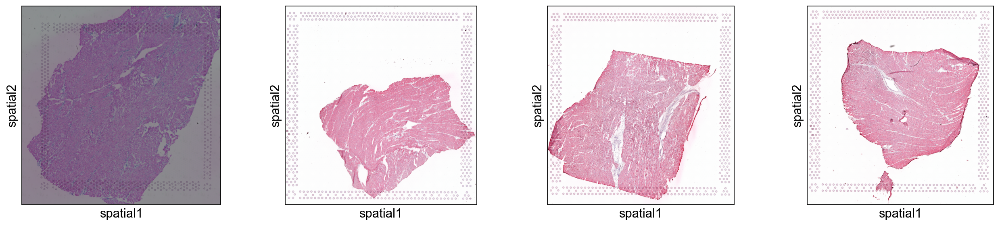

In [3]:
sq.pl.spatial_scatter(adata_st, library_key="patient_region_id")

The function returns one plot for each hostological image present in the dataset. Each sample comes from one patient in the control group and looks substantially different when just observing the image representation.

In [5]:
adata_st.obs

,in_tissue,array_row,array_col,patient,patient_region_id,patient_group,major_label,batch
AAACAAGTATCTCCCA-1-0,1,50,102,P1,control_P1,group_1,CTRL,0
AAACAATCTACTAGCA-1-0,1,3,43,P1,control_P1,group_1,CTRL,0
AAACACCAATAACTGC-1-0,1,59,19,P1,control_P1,group_1,CTRL,0
AAACAGAGCGACTCCT-1-0,1,14,94,P1,control_P1,group_1,CTRL,0
AAACAGCTTTCAGAAG-1-0,1,43,9,P1,control_P1,group_1,CTRL,0
...,...,...,...,...,...,...,...,...
TTGTTCTAGATACGCT-1-3,1,21,3,P8,control_P8,group_1,CTRL,3
TTGTTGTGTGTCAAGA-1-3,1,31,77,P8,control_P8,group_1,CTRL,3
TTGTTTCACATCCAGG-1-3,1,58,42,P8,control_P8,group_1,CTRL,3
TTGTTTCATTAGTCTA-1-3,1,60,30,P8,control_P8,group_1,CTRL,3


In [6]:
adata_sc = sc.read(
    filename="dataset/kuppe_snRNA_human_heart_2022_control.h5ad",
    backup_url="https://figshare.com/ndownloader/files/39347573",
)
adata_sc

try downloading from url
https://figshare.com/ndownloader/files/39347573
... this may take a while but only happens once


100%|██████████| 3.00G/3.00G [11:34<00:00, 4.64MB/s]   


AnnData object with n_obs × n_vars = 41663 × 29046
    obs: 'sample', 'n_counts', 'n_genes', 'percent_mito', 'doublet_score', 'dissociation_score', 'patient_region_id', 'donor_id', 'patient_group', 'major_labl', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_type', 'cell_type_original'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'X_approximate_distribution', 'batch_condition', 'cell_type_colors', 'cell_type_original_colors', 'default_embedding', 'schema_version', 'title'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'normalized_counts'

The control reference dataset is already processed and annotated with the identified cell types. We will use the original cell type label throughout the notebook and reset adata_sc.X to the raw counts stored in layers.

/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


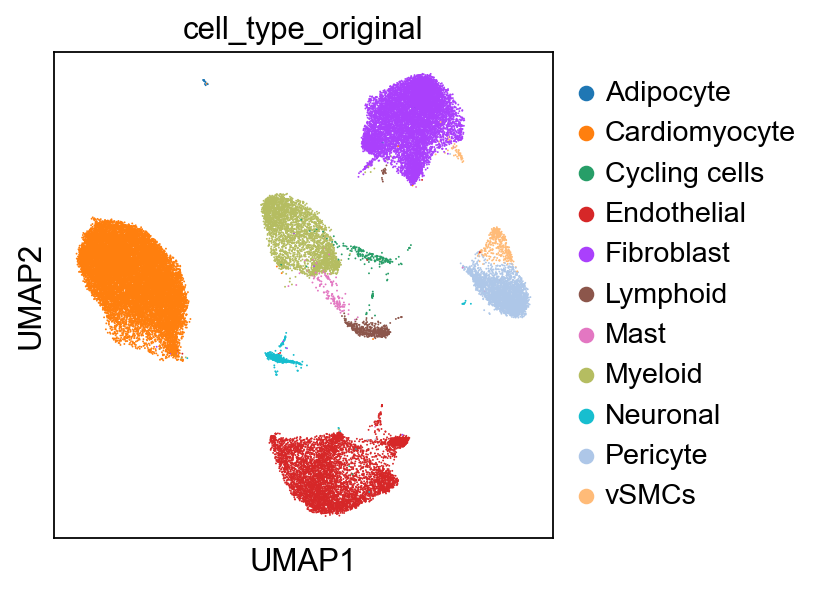

In [7]:
adata_sc.X = adata_sc.layers["counts"]

sc.pl.umap(adata_sc, color="cell_type_original")

In [8]:
adata_st.var.head()

,gene_ids,feature_types,genome
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38
FAM138A,ENSG00000237613,Gene Expression,GRCh38
OR4F5,ENSG00000186092,Gene Expression,GRCh38
AL627309.1,ENSG00000238009,Gene Expression,GRCh38
AL627309.3,ENSG00000239945,Gene Expression,GRCh38


In [9]:
# For performing the deconvolution, Cell2location requires ENSEMBL gene identifies to be stored in adata_st.var_names to accurately map between single cell and spatial data.

adata_st.var["feature_name"] = adata_st.var_names
adata_st.var.set_index("gene_ids", drop=True, inplace=True)

In [10]:
adata_st.var.head()

,feature_types,genome,feature_name
gene_ids,,,
ENSG00000243485,Gene Expression,GRCh38,MIR1302-2HG
ENSG00000237613,Gene Expression,GRCh38,FAM138A
ENSG00000186092,Gene Expression,GRCh38,OR4F5
ENSG00000238009,Gene Expression,GRCh38,AL627309.1
ENSG00000239945,Gene Expression,GRCh38,AL627309.3


In [11]:
# it is recommended to remove mitochondrial genes from the dataset as they represent technical artifacts rather than biological abundance of mitochondria.
# find mitochondrial (MT) genes
adata_st.var["MT_gene"] = [
    gene.startswith("MT-") for gene in adata_st.var["feature_name"]
]

# remove MT genes for spatial mapping (keeping their counts in the object)
adata_st.obsm["MT"] = adata_st[:, adata_st.var["MT_gene"].values].X.toarray()
adata_st = adata_st[:, ~adata_st.var["MT_gene"].values]

In [12]:
# subset both datasets to the same gene set which is the baseline for the mapping between the single cell and spatial data.

shared_features = [
    feature for feature in adata_st.var_names if feature in adata_sc.var_names
]
adata_sc = adata_sc[:, shared_features].copy()
adata_st = adata_st[:, shared_features].copy()

# Fitting the reference model

/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


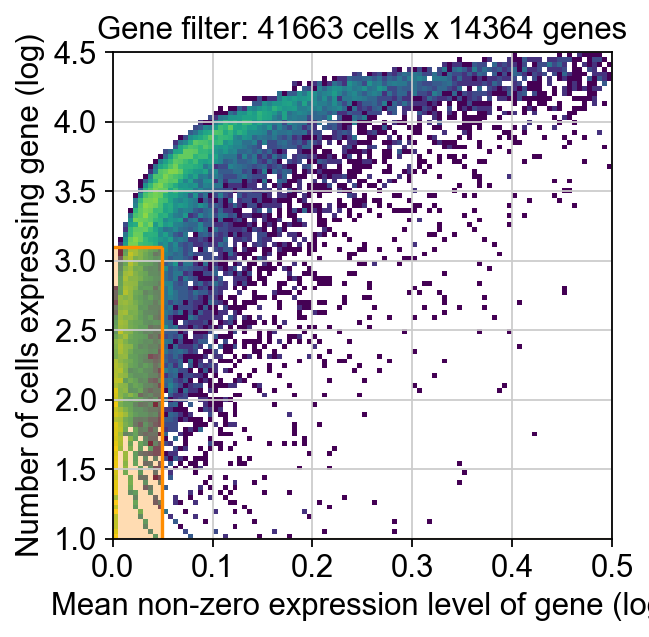

In [13]:
# To ensure the reference is of high quality, cell2location recommends to perform a very permissive gene selection
selected = c2l.utils.filtering.filter_genes(
    adata_sc, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12
)

 The Y-axis shows the number of cells expressing that gene and the X-axis the average RNA count for cells with a detected gene.

In [48]:
selected

Index(['ENSG00000237491', 'ENSG00000228794', 'ENSG00000188976',
       'ENSG00000187642', 'ENSG00000188290', 'ENSG00000187608',
       'ENSG00000131591', 'ENSG00000078808', 'ENSG00000160087',
       'ENSG00000131584',
       ...
       'ENSG00000183878', 'ENSG00000165246', 'ENSG00000286201',
       'ENSG00000176728', 'ENSG00000012817', 'ENSG00000229236',
       'ENSG00000198692', 'ENSG00000278384', 'ENSG00000273748',
       'ENSG00000273554'],
      dtype='object', name='feature_id', length=14364)

In [14]:
adata_sc = adata_sc[:, selected].copy()
adata_st = adata_st[:, selected].copy()

In [53]:
adata_sc.obs[['donor_id', 'assay', 'cell_type_original']]

,donor_id,assay,cell_type_original
AAACCCACAAAGGAGA-1_1_1_1_1_1_1_1_1_1_1_1_1_1_1,P1,10x 3' v3,Fibroblast
AAACCCACAGAGATGC-1_1_1_1_1_1_1_1_1_1_1_1_1_1_1,P1,10x 3' v3,Cardiomyocyte
AAACCCAGTAACGGTG-1_1_1_1_1_1_1_1_1_1_1_1_1_1_1,P1,10x 3' v3,Cardiomyocyte
AAACCCAGTCCAGAAG-1_1_1_1_1_1_1_1_1_1_1_1_1_1_1,P1,10x 3' v3,Fibroblast
AAACCCAGTCGTCGGT-1_1_1_1_1_1_1_1_1_1_1_1_1_1_1,P1,10x 3' v3,Cardiomyocyte
...,...,...,...
TTTGTTGCACTGAGGA-1_1,P17,10x 3' v3,Endothelial
TTTGTTGGTGCTAGCC-1_1,P17,10x 3' v3,Cardiomyocyte
TTTGTTGTCAGAGCGA-1_1,P17,10x 3' v3,Cardiomyocyte
TTTGTTGTCAGATTGC-1_1,P17,10x 3' v3,Endothelial


In [55]:
adata_sc.obs['assay'].value_counts()

assay
10x 3' v3    41663
Name: count, dtype: int64

In [15]:
c2l.models.RegressionModel.setup_anndata(
    adata=adata_sc,
    batch_key="donor_id",
    labels_key="cell_type_original",
    categorical_covariate_keys=["assay"],
    layer="counts",
)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [16]:
model = c2l.models.RegressionModel(adata_sc)
# default, try on GPU:
use_gpu = True
model.train(max_epochs=250, batch_size=2500, train_size=1, lr=0.002, use_gpu=use_gpu)

/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/scvi/train/_trainrunner.py:76: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  accelerator, lightning_devices, device = parse_device_args(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pyto

Epoch 250/250: 100%|██████████| 250/250 [19:43<00:00,  4.75s/it, v_num=1, elbo_train=2.95e+8]

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████| 250/250 [19:43<00:00,  4.73s/it, v_num=1, elbo_train=2.95e+8]


By inspecting the training history, one can determine whether the model needs more training. This plot should have a decreasing trend and should level off, otherwise one needs to increase the max_epochs parameter.

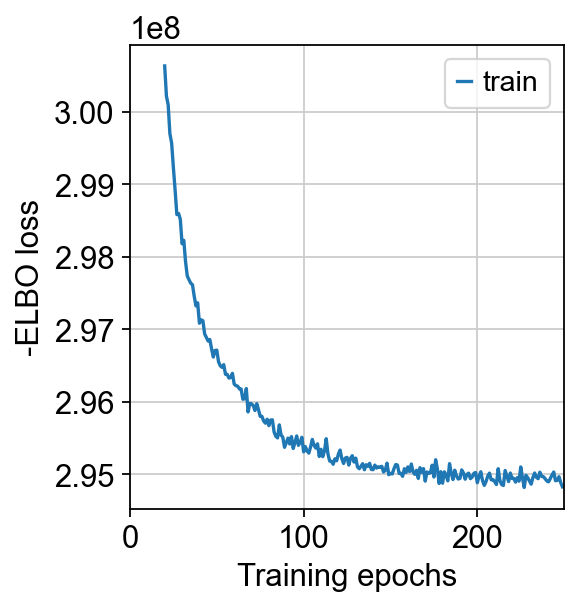

In [17]:
model.plot_history(20)

In [18]:
model.export_posterior(
    adata_sc,
    sample_kwargs={"num_samples": 1000, "batch_size": 2500, "use_gpu": use_gpu},
)

/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/scvi/model/base/_pyromixin.py:388: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  _, _, device = parse_device_args(


Sampling global variables, sample: 100%|██████████| 999/999 [00:14<00:00, 69.12it/s]


AnnData object with n_obs × n_vars = 41663 × 14364
    obs: 'sample', 'n_counts', 'n_genes', 'percent_mito', 'doublet_score', 'dissociation_score', 'patient_region_id', 'donor_id', 'patient_group', 'major_labl', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_type', 'cell_type_original', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'n_cells', 'nonz_mean'
    uns: 'X_approximate_distribution', 'batch_condition', 'cell_type_colors', 'cell_type_original_colors', 'default_embedding', 'schema_version', 'title', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'X_harmony', 'X_pca', 'X_umap', '_scvi_extra_categorical_covs'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'
    layers: 'counts', 'normalized_counts'

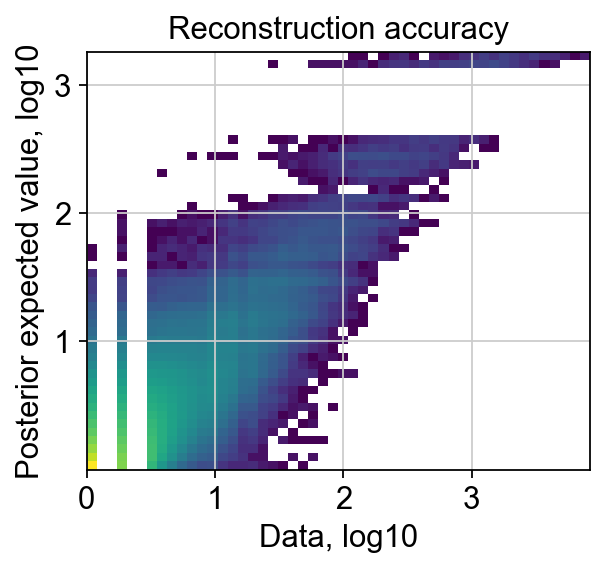

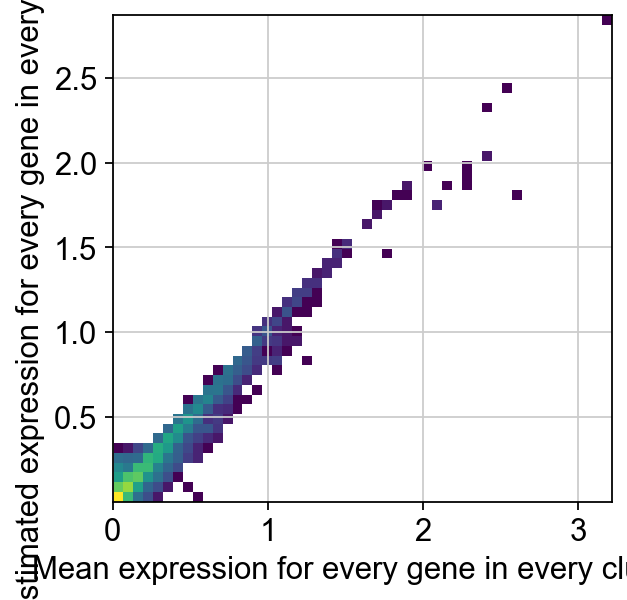

In [19]:
model.plot_QC()

In [20]:
# export estimated expression in each cluster
if "means_per_cluster_mu_fg" in adata_sc.varm.keys():
    inf_aver = adata_sc.varm["means_per_cluster_mu_fg"][
        [f"means_per_cluster_mu_fg_{i}" for i in adata_sc.uns["mod"]["factor_names"]]
    ].copy()
else:
    inf_aver = adata_sc.var[
        [f"means_per_cluster_mu_fg_{i}" for i in adata_sc.uns["mod"]["factor_names"]]
    ].copy()

inf_aver.columns = adata_sc.uns["mod"]["factor_names"]
inf_aver.head()

,Adipocyte,Cardiomyocyte,Cycling cells,Endothelial,Fibroblast,Lymphoid,Mast,Myeloid,Neuronal,Pericyte,vSMCs
feature_id,,,,,,,,,,,
ENSG00000237491,0.334527,0.087345,0.132428,0.026552,0.077226,0.021934,0.040239,0.037089,0.039922,0.025913,0.059219
ENSG00000228794,0.317449,0.856339,0.054783,0.044679,0.045089,0.050721,0.072622,0.047937,0.056708,0.040801,0.082163
ENSG00000188976,0.131398,0.163149,0.104772,0.018118,0.083007,0.039447,0.028498,0.039455,0.019100,0.033634,0.064370
ENSG00000187642,0.053498,0.510094,0.013615,0.010326,0.006524,0.003621,0.030770,0.008980,0.003009,0.007714,0.006677
ENSG00000188290,0.059882,0.122700,0.017073,0.083059,0.070342,0.014752,0.018788,0.008424,0.053858,0.411816,0.509223


In [ ]:
# inf_aver.to_csv("inf_aver.csv")

# Cell2Location cell type mapping

In [21]:
# prepare the data for the actual spatial mapping with setup_anndata for the Cell2location model.

c2l.models.Cell2location.setup_anndata(
    adata=adata_st,
    batch_key="patient",
)

Cell2location requires two user-provided hyperparameters (`` and detection_alpha).``

 - '`N_cells_per_location` describes the expected cell abundance in each location or spot. This can usually be obtained through paired histology images. We will use `N_cells_per_location=8` in this tutorial.

 - `detection_alpha` handles the technical varibility in in RNA detection sensitivity within the slide/batch. The technical variability in RNA detection sensitivity can also be extracted based on histological examination. For more information we refer the analyst to the documentation of cell2location. The default value is `detection_alpha=20`.

In [22]:
model = c2l.models.Cell2location(
    adata_st,
    cell_state_df=inf_aver,
    N_cells_per_location=8,
)
model.view_anndata_setup()

Anndata setup with scvi-tools version 1.0.3.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'patient',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   4   │
│         n_cells          │ 11725 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 14364 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location    ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['patient'] │     P1     │          0          │
│                      │     P7     │          1          │
│                      │     P8     │          2          │
│                      │    P17     │          3          │
└──────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [ ]:
model.train(max_epochs=None, batch_size=8192, train_size=1, use_gpu=use_gpu)  # max_epochs=30000
# plot training history
# model.plot_history()

In [37]:
adata_st = model.export_posterior(
    adata_st,
    sample_kwargs={
        "num_samples": 1000,
        "batch_size": model.adata.n_obs,
        "use_gpu": use_gpu,
    },
)

/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/scvi/model/base/_pyromixin.py:388: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  _, _, device = parse_device_args(


Sampling global variables, sample: 100%|██████████| 999/999 [00:52<00:00, 19.20it/s]


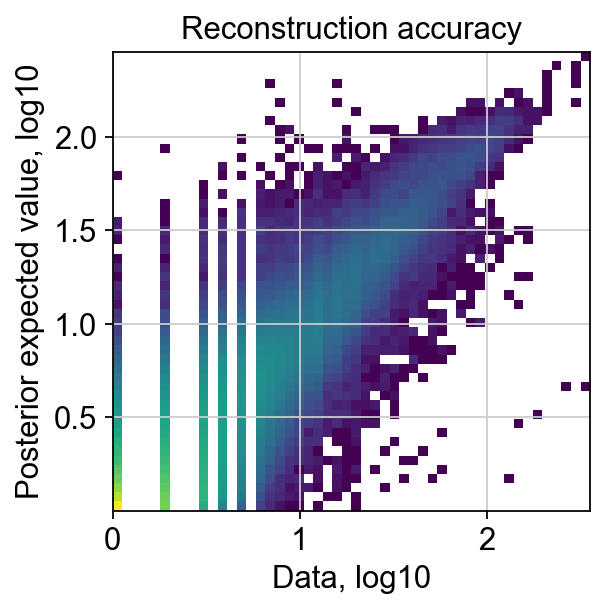

In [38]:
model.plot_QC()

**As we can see the reconstruction accuracy roughly shows a diagonal, so we can continue with the analysis and inspecting the results.**

We can now visualize the cell abundance mapped to the spatial coordinates. In this case we are using the 5% quantile of the posterior distribution, which represents that the model has a high confidence and at last 5% are present.

In [39]:
adata_st.obs[adata_st.uns["mod"]["factor_names"]] = adata_st.obsm[
    "q05_cell_abundance_w_sf"
]

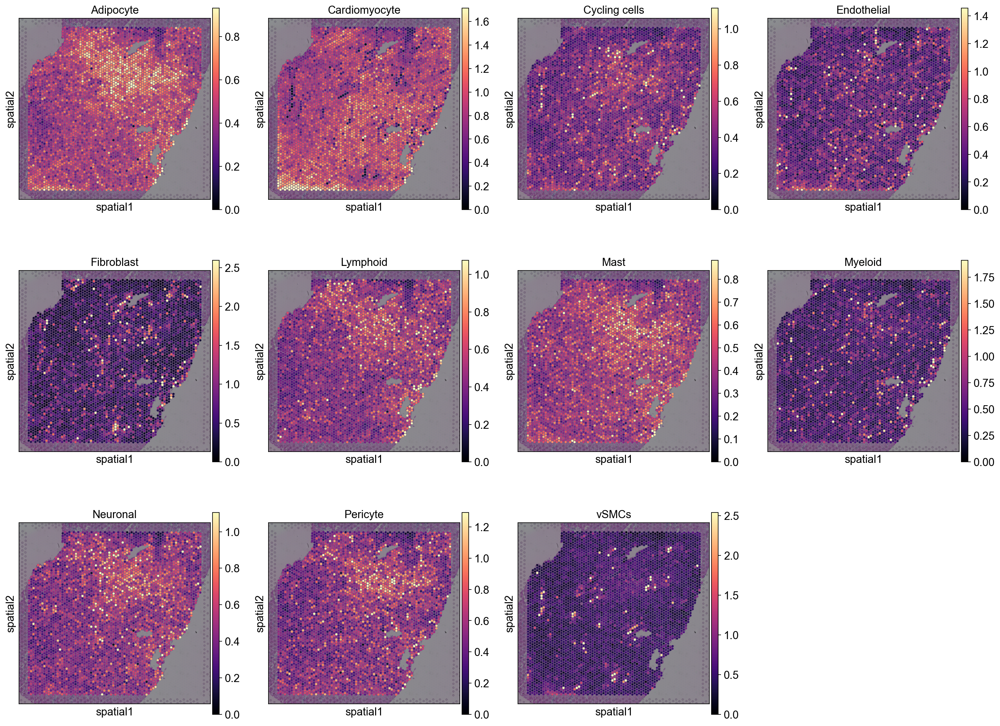

In [40]:
# select one slide for visualization
slide = c2l.utils.select_slide(adata_st, "control_P1", batch_key="patient_region_id")

with matplotlib.rc_context({"figure.figsize": [4.5, 5]}):
    sc.pl.spatial(
        slide,
        cmap="magma",
        color=adata_st.uns["mod"]["factor_names"],
        ncols=4,
        size=1.3,
        img_key="hires",
        # limit color scale at 99.2% quantile of cell abundance
        vmin=0,
        vmax="p99.2",
    )

As one can see, the estimated cell type abundances vary between spots and cell types. Cardiomyoctes seem to be present in most spots while cell types only appear in a few spots.

In [58]:
slide

AnnData object with n_obs × n_vars = 4279 × 14364
    obs: 'in_tissue', 'array_row', 'array_col', 'patient', 'patient_region_id', 'patient_group', 'major_label', 'batch', '_indices', '_scvi_batch', '_scvi_labels', 'Adipocyte', 'Cardiomyocyte', 'Cycling cells', 'Endothelial', 'Fibroblast', 'Lymphoid', 'Mast', 'Myeloid', 'Neuronal', 'Pericyte', 'vSMCs'
    var: 'feature_types', 'genome', 'feature_name', 'MT_gene'
    uns: 'spatial', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'MT', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'
    layers: 'Adipocyte', 'Cardiomyocyte', 'Cycling cells', 'Endothelial', 'Fibroblast', 'Lymphoid', 'Mast', 'Myeloid', 'Neuronal', 'Pericyte', 'vSMCs'

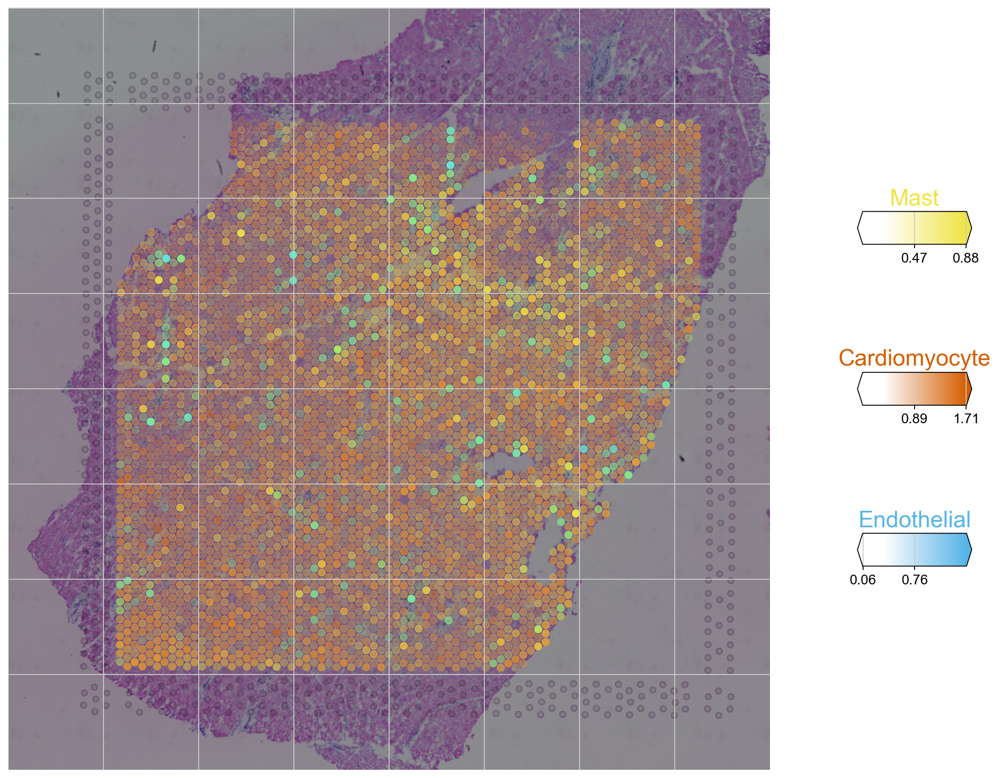

In [41]:
clust_col = ["Mast", "Cardiomyocyte", "Endothelial"]
clust_labels = clust_col

with matplotlib.rc_context({"figure.figsize": (15, 15)}):
    fig = c2l.plt.plot_spatial(
        adata=slide,
        color=clust_col,
        labels=clust_labels,
        max_color_quantile=0.992,
        circle_diameter=6,
        show_img=True,
        colorbar_position="right",
        colorbar_shape={"horizontal_gaps": 0.2},
    )

# Downstream analysis

## Cell-type specific expression of every gene in the spatial data

In [42]:
# Compute expected expression per cell type
expected_dict = model.module.model.compute_expected_per_cell_type(
    model.samples["post_sample_q05"], model.adata_manager
)

# Add to anndata layers
for i, n in enumerate(model.factor_names_):
    adata_st.layers[n] = expected_dict["mu"][i]

We can visualize the cell-type specific expression by specifying the layer that should be used for plotting. Here we show four genes for cardiomyocytes (心肌细胞).

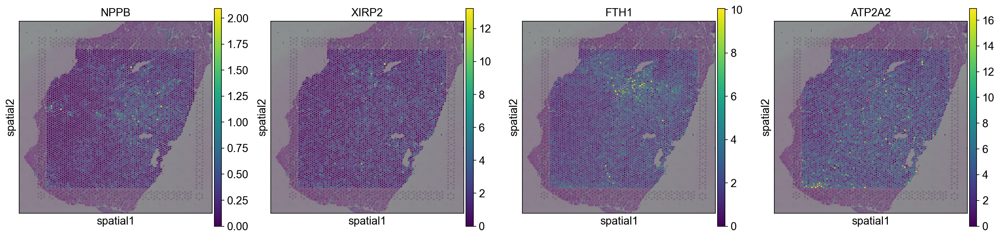

In [43]:
slide = c2l.utils.select_slide(adata_st, "control_P1", batch_key="patient_region_id")

with matplotlib.rc_context({"figure.figsize": [4.5, 5]}):
    sq.pl.spatial_scatter(
        slide,
        color=["NPPB", "XIRP2", "FTH1", "ATP2A2"],
        layer="Cardiomyocyte",
        alt_var="feature_name",
    )

## Discrete tissue regions

Based on the computed cell abundance estimated by cell2location, we can identify tissue reagion with similar cell compositions. For this purpose we compute a KNN graph based on the 5% cell abundance and perform leiden clustering in the connectivities. The clustering is performed on all sections jointly to identify comparable tissue regions across samples.

In [44]:
sc.pp.neighbors(adata_st, use_rep="q05_cell_abundance_w_sf")
sc.tl.leiden(adata_st, resolution=0.5)
adata_st.obs["region_cluster"] = adata_st.obs["leiden"].astype("category")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


/home/mowp/mambaforge/envs/st/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


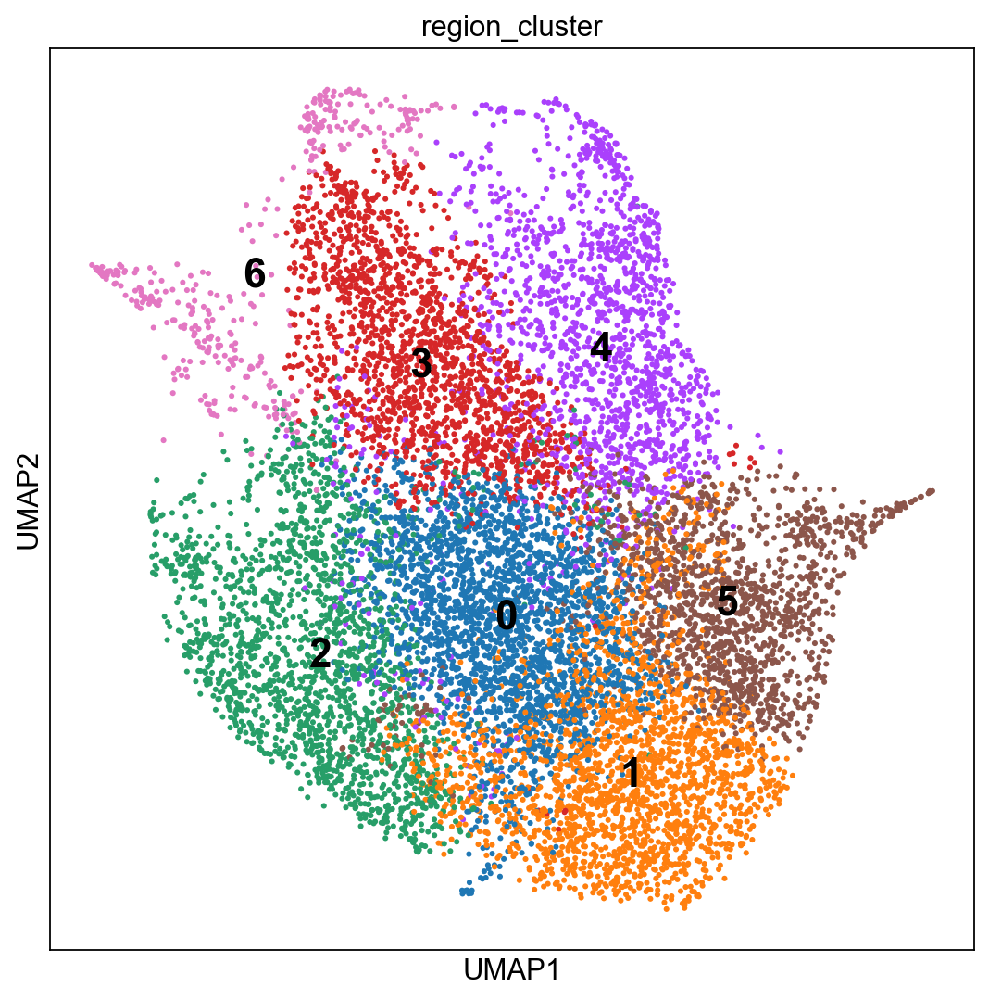

In [45]:
sc.tl.umap(adata_st, min_dist=0.3, spread=1)

with matplotlib.rc_context({"axes.facecolor": "white", "figure.figsize": [8, 8]}):
    sc.pl.umap(
        adata_st,
        color=["region_cluster"],
        size=30,
        color_map="RdPu",
        ncols=2,
        legend_loc="on data",
        legend_fontsize=20,
    )

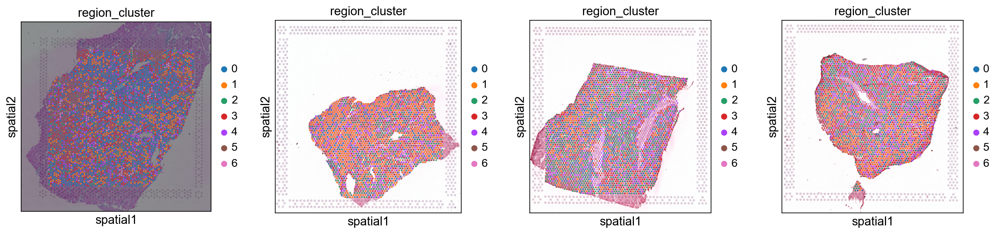

In [46]:
sq.pl.spatial_scatter(adata_st, color="region_cluster", library_key="patient_region_id")